In [ ]:

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
%matplotlib inline
import os
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import cv2
import numpy as np
from glob import glob
import seaborn as sns

In [4]:
BASE_DATA_FOLDER = "/content/drive/MyDrive/dataset brain tumbor"
TRAin_DATA_FOLDER = os.path.join(BASE_DATA_FOLDER, "Training")

In [5]:
images_per_class = {}
for class_folder_name in os.listdir(TRAin_DATA_FOLDER):
    class_folder_path = os.path.join(TRAin_DATA_FOLDER, class_folder_name)
    class_label = class_folder_name
    images_per_class[class_label] = []
    for image_path in glob(os.path.join(class_folder_path, "*.jpg")):
        image_bgr = cv2.imread(image_path, cv2.IMREAD_COLOR)
        images_per_class[class_label].append(image_bgr)

In [6]:
for key,value in images_per_class.items():
    print("{0} -> {1}".format(key, len(value)))

notumor -> 2000
glioma -> 1620
meningioma -> 1645
pituitary -> 1757


In [7]:
def plot_for_class(label):
    nb_rows = 3
    nb_cols = 3
    fig, axs = plt.subplots(nb_rows, nb_cols, figsize=(6, 6))

    n = 0
    for i in range(0, nb_rows):
        for j in range(0, nb_cols):
            axs[i, j].xaxis.set_ticklabels([])
            axs[i, j].yaxis.set_ticklabels([])
            axs[i, j].imshow(images_per_class[label][n])
            n += 1     

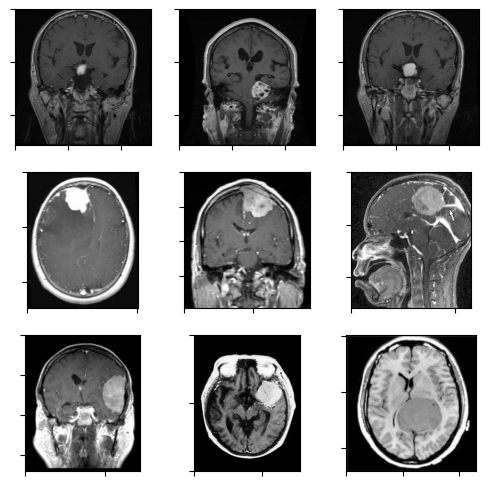

In [8]:
plot_for_class("meningioma")

In [9]:
def sift_image(image):
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Initialize the SIFT detector
    sift = cv2.xfeatures2d.SIFT_create()

    # Detect the keypoints and compute the descriptors
    keypoints, descriptors = sift.detectAndCompute(gray_image, None)

    # Draw the detected keypoints on the original RGB image
    image_with_keypoints = cv2.drawKeypoints(image, keypoints, None)
    return image_with_keypoints

def canny_image(image):
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian smoothing to the grayscale image
    smoothed_image = cv2.GaussianBlur(gray_image, (3, 3), 0)

    # Apply the Canny filter to the smoothed grayscale image
    low_threshold = 50
    high_threshold = 150
    canny_image = cv2.Canny(smoothed_image, low_threshold, high_threshold)

    # Convert the filtered grayscale image back to RGB
    canny_image_rgb = cv2.cvtColor(np.uint8(canny_image), cv2.COLOR_GRAY2RGB)
    return canny_image_rgb

def sobel_image(image): 
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply the Sobel filter to the grayscale image
    sobel_x = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1, ksize=3)
    filtered_image = cv2.magnitude(sobel_x, sobel_y)

    # Convert the filtered image back to RGB
    filtered_image_rgb = cv2.cvtColor(np.uint8(filtered_image), cv2.COLOR_GRAY2RGB)
    return filtered_image_rgb

def harris_image(image):

    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Define parameters for the Harris corner detector
    block_size = 2
    aperture_size = 3
    k = 0.04

    # Apply the Harris corner detector
    dst = cv2.cornerHarris(gray, block_size, aperture_size, k)

    # Threshold the corner response
    threshold = 0.1 * dst.max()
    corner_mask = np.zeros_like(dst)
    corner_mask[dst > threshold] = 255
    return corner_mask

def orb_image(image):
    # Create an ORB object with default parameters
    orb = cv2.ORB_create()

    # Detect keypoints in the image using ORB
    keypoints = orb.detect(image, None)

    # Compute descriptors for the ORB keypoints
    keypoints, descriptors = orb.compute(image, keypoints)

    # Draw the detected keypoints on the image
    img_with_keypoints = cv2.drawKeypoints(image, keypoints, None, color=(0, 255, 0), flags=0)
    return img_with_keypoints

def gradient_distance(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Compute the gradient magnitude image for the image
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    gradient = cv2.magnitude(sobel_x, sobel_y)

    # Compute the absolute difference between the gradient magnitude image and a shifted version of itself
    shifted_gradient = np.roll(gradient, 1, axis=0)
    diff = cv2.absdiff(gradient, shifted_gradient)
    return diff


def mean_filter(image):
    filtered_img = cv2.blur(image, (5, 5))
    return filtered_img


def median_filter(image):
    filtered_img = cv2.medianBlur(image, 5)
    return filtered_img


def gaussian_smoothing(image):
    filtered_img = cv2.GaussianBlur(image, (5, 5), 0)
    return filtered_img


def perwitt_filter(image):
    
    gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # define the Prewitt kernel for horizontal edge detection
    kernel_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])

    # apply the Prewitt filter to the image
    filtered_img = cv2.filter2D(gray_img, -1, kernel_x)
    return filtered_img



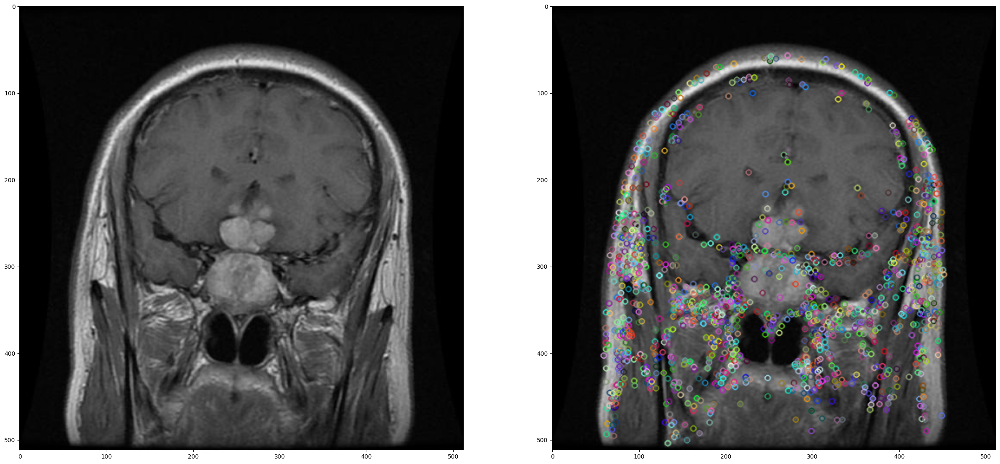

In [10]:
img1 = images_per_class["pituitary"][78]

image_sift = sift_image(img1)

fig, axs = plt.subplots(1, 2, figsize=(30, 30))
axs[0].imshow(img1)
axs[1].imshow(image_sift)


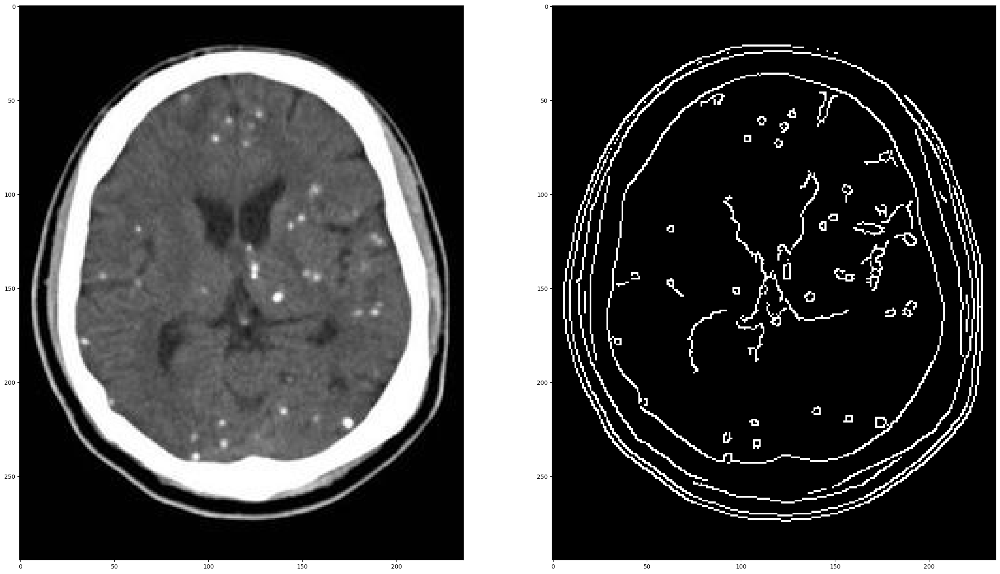

In [11]:
img2 = images_per_class["notumor"][5]

image_canny = canny_image(img2)

fig, axs = plt.subplots(1, 2, figsize=(30, 30))
axs[0].imshow(img2)
axs[1].imshow(image_canny)

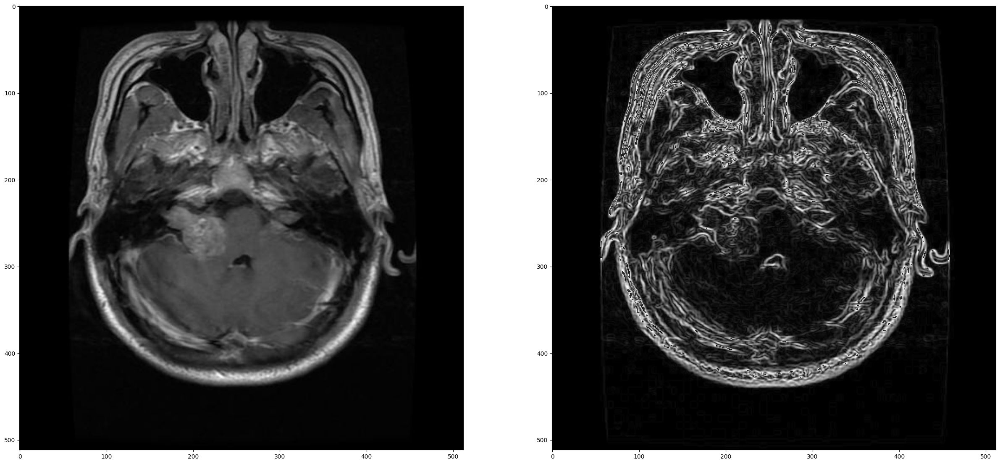

In [12]:
img3 = images_per_class["meningioma"][78]

image_sobel = sobel_image(img3)

fig, axs = plt.subplots(1, 2, figsize=(30, 30))
axs[0].imshow(img3)
axs[1].imshow(image_sobel)

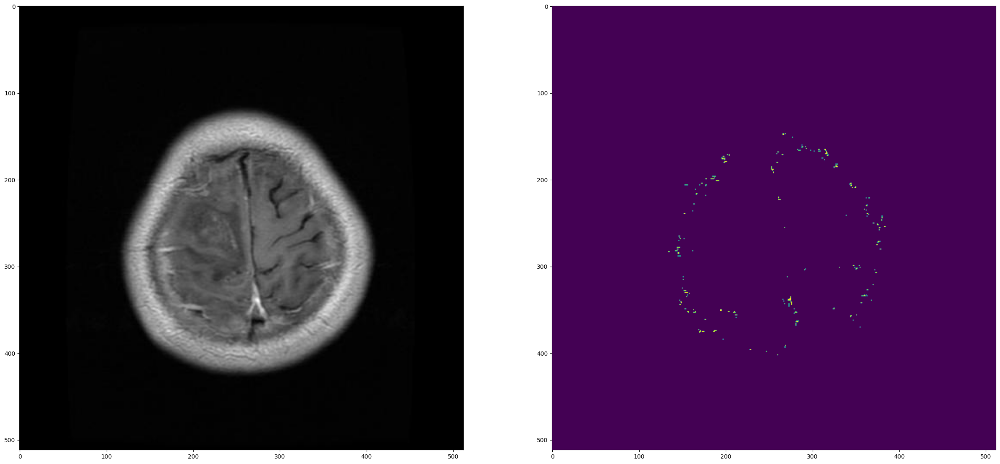

In [13]:
img4 = images_per_class["glioma"][787]

image_harris = harris_image(img4)

fig, axs = plt.subplots(1, 2, figsize=(30, 30))
axs[0].imshow(img4)
axs[1].imshow(image_harris)

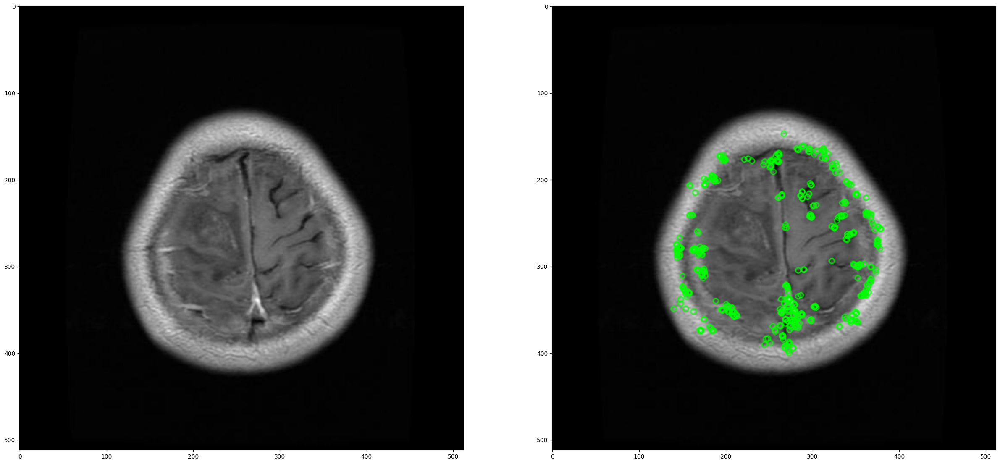

In [14]:
img5 = images_per_class["glioma"][787]

image_orb = orb_image(img5)

fig, axs = plt.subplots(1, 2, figsize=(30, 30))
axs[0].imshow(img5)
axs[1].imshow(image_orb)

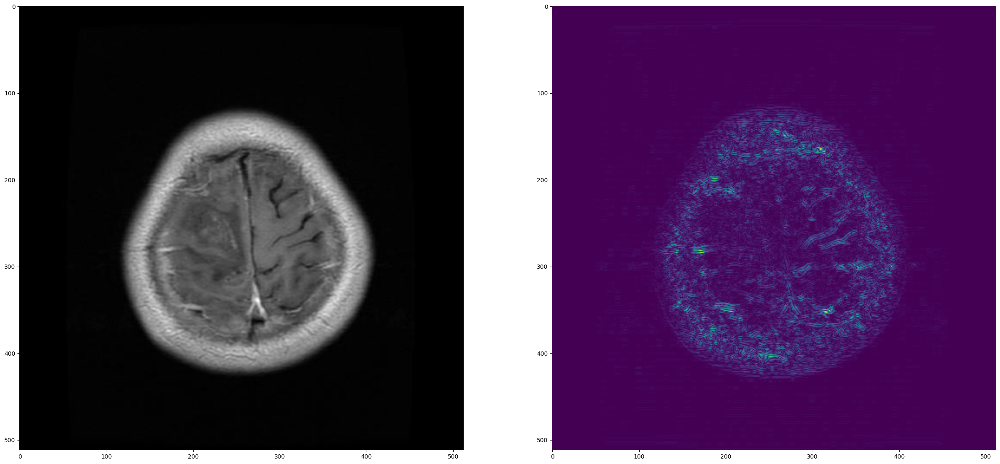

In [15]:
img6 = images_per_class["glioma"][787]

gradient_distance_image = gradient_distance(img6)

fig, axs = plt.subplots(1, 2, figsize=(30, 30))
axs[0].imshow(img6)
axs[1].imshow(gradient_distance_image)

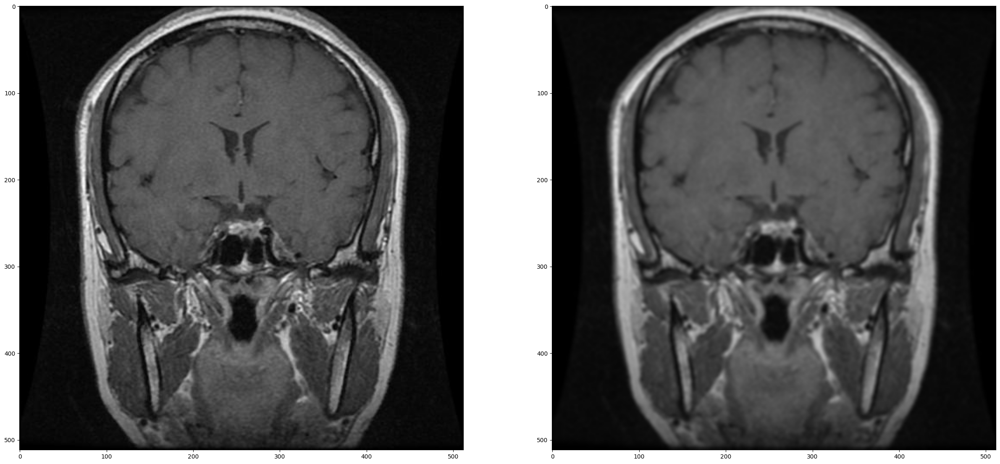

In [16]:
img7 = images_per_class["pituitary"][90]

image_mean = mean_filter(img7)

fig, axs = plt.subplots(1, 2, figsize=(30, 30))
axs[0].imshow(img7)
axs[1].imshow(image_mean)

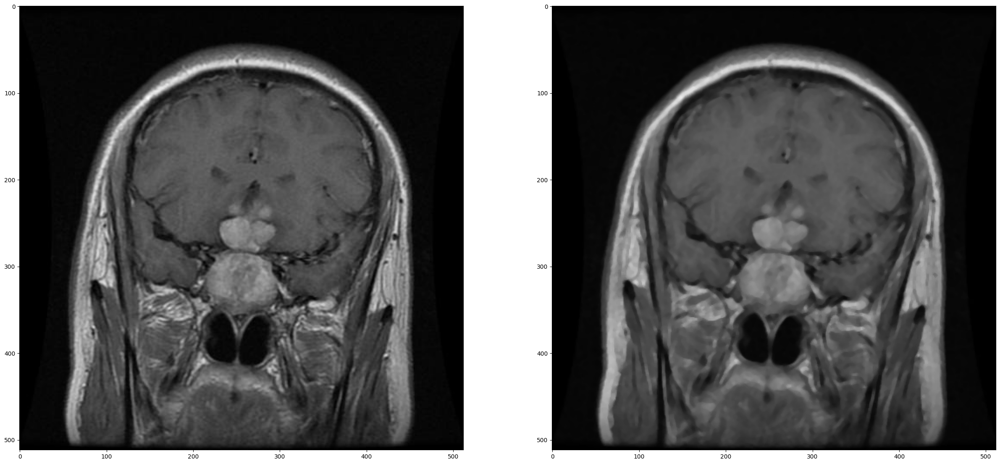

In [17]:
img8 = images_per_class["pituitary"][78]

image_median = median_filter(img8)

fig, axs = plt.subplots(1, 2, figsize=(30, 30))
axs[0].imshow(img8)
axs[1].imshow(image_median)

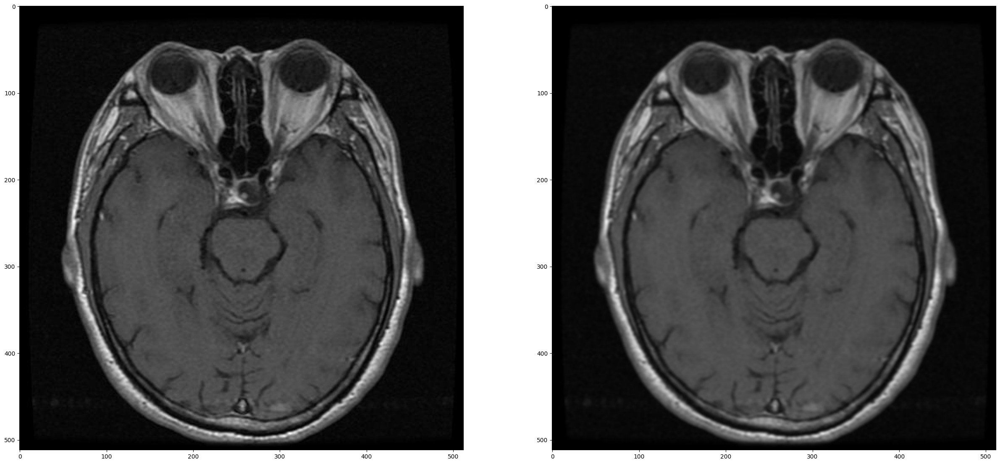

In [18]:
img9 = images_per_class["pituitary"][112]

image_smooth = gaussian_smoothing(img9)

fig, axs = plt.subplots(1, 2, figsize=(30, 30))
axs[0].imshow(img9)
axs[1].imshow(image_smooth)

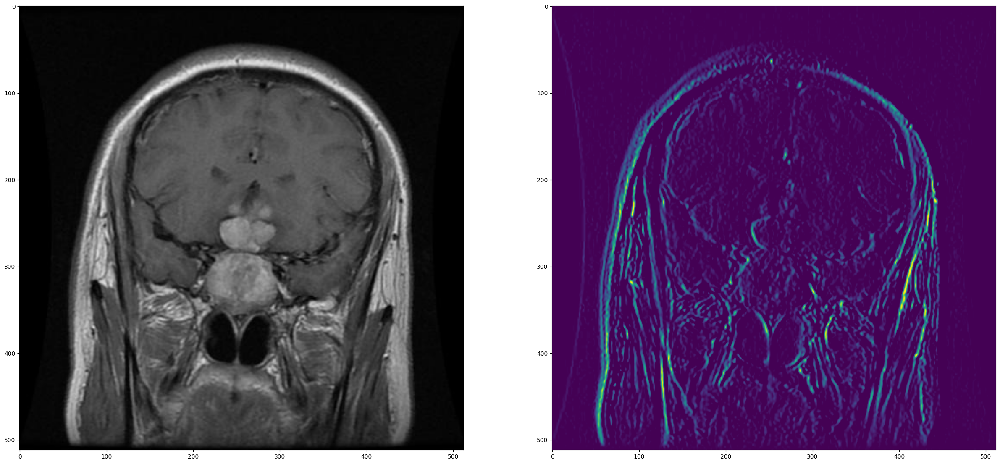

In [19]:
img10 = images_per_class["pituitary"][78]

image_prewitt = perwitt_filter(img10)

fig, axs = plt.subplots(1, 2, figsize=(30, 30))
axs[0].imshow(img10)
axs[1].imshow(image_prewitt)

In [20]:
import os
from tensorflow.keras.utils import load_img, img_to_array
import numpy as np
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

In [21]:
train_dir = '/content/drive/MyDrive/dataset brain tumbor/Training'
test_dir = '/content/drive/MyDrive/dataset brain tumbor/Testing'

class_names = ['pituitary', 'notumor', 'meningioma', 'glioma']

train_images = []
train_labels = []
test_images = []
test_labels = []

for class_name in class_names:
    train_class_dir = os.path.join(train_dir, class_name)
    test_class_dir = os.path.join(test_dir, class_name)
    
    for train_file in os.listdir(train_class_dir):
        train_image_path = os.path.join(train_class_dir, train_file)
        train_image = load_img(train_image_path, target_size=(224, 224))
        train_image = img_to_array(train_image)
        train_image =sobel_image(train_image)
        train_images.append(train_image)
        train_labels.append(class_names.index(class_name))
        
    for test_file in os.listdir(test_class_dir):
        test_image_path = os.path.join(test_class_dir, test_file)
        test_image = load_img(test_image_path, target_size=(224, 224))
        test_image = img_to_array(test_image)
        test_image = sobel_image(test_image)
        test_images.append(test_image)
        test_labels.append(class_names.index(class_name))

In [22]:
# Preprocess the data
train_images = np.array(train_images, dtype='float32') / 255.0
test_images = np.array(test_images, dtype='float32') / 255.0
train_labels = to_categorical(train_labels, num_classes=4)
test_labels = to_categorical(test_labels, num_classes=4)

In [23]:
# Define the model architecture
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 1)))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dense(4, activation='softmax'))

In [24]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 186624)            0         
                                                                 
 dense (Dense)               (None, 64)                1

In [25]:
# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [1]:
# Train the model
model.fit(train_images, train_labels, epochs=5, batch_size=60, validation_data=(test_images, test_labels))

NameError: ignored